# Week 5: Working with Visual Documents in RAG Systems

> **Prerequisites**: Please make sure to install the `poppler` library before continuing. See [installation instructions here](https://poppler.freedesktop.org).

Many real-world documents like invoices, forms, and reports combine text with visual layouts that carry important meaning. Traditional text embedding model based approaches can lose this structural information. 

In this notebook, we'll explore how to use Cohere's multimodal Embed V4 model to work directly with visual representations of documents, extending our retrieval capabilities beyond pure text.

## Why This Matters

Organizations store critical information in structured documents that rely on both content and layout. Being able to query these documents while preserving their visual context improves answer accuracy and citation quality. 

This approach is particularly valuable for financial documents, contracts, and other documents that require a deeper understanding of the document content.

## What You'll Learn

Through hands-on work with PDF documents, you'll discover how to:

1. **Process PDFs as Images**
   - Convert PDF pages to image representations
   - Prepare visual content for embedding
   - Handle document scaling and formatting

2. **Generate Multimodal Embeddings**
   - Leverage Cohere's Embed V4 model capabilities
   - Store embeddings efficiently in vector databases
   - Process batches of documents asynchronously

3. **Build Visual Query Systems**
   - Create search functions for document retrieval
   - Visualize search results with original document context

By the end of this notebook, you'll have expanded your RAG toolkit and taken your first steps to working with multimodal embeddings. When combined with our previous work on metadata filtering and query understanding, this helps to address the unique challenges of document-based information retrieval.

## Setting up our Document Processing Pipeline

Before we can search our documents effectively, we need to transform them into a format that preserves their visual structure. 

This section covers how to convert PDFs into properly scaled images that capture both content and layout, preparing them for the embedding process.

We'll do so in three steps:

1. Use the PDF2Image library to convert PDF pages to image format
2. Resize images to meet embedding model requirements
3. Convert images to base64 encoding for API compatibility

Once we've done so, we can then ingest our documents into our local LanceDB database to query against.

In [58]:
import os
from pdf2image import convert_from_path
import io
import base64
import PIL
import tempfile

DATA_DIR = "./data/documents"
max_pixels = 1568 * 1568  

def get_documents(data_dir):
    """
    Get all documents from the given directory.
    """
    for file in os.listdir(data_dir):
        if file.endswith(".pdf"):
            yield file



# Resize too large images
def resize_image(pil_image):
    org_width, org_height = pil_image.size

    # Resize image if too large
    if org_width * org_height > max_pixels:
        scale_factor = (max_pixels / (org_width * org_height)) ** 0.5
        new_width = int(org_width * scale_factor)
        new_height = int(org_height * scale_factor)
        pil_image.thumbnail((new_width, new_height))


# Convert images to a base64 string before sending it to the API
def base64_from_image(img_path):
    pil_image = PIL.Image.open(img_path)
    img_format = pil_image.format if pil_image.format else "PNG"

    resize_image(pil_image)

    with io.BytesIO() as img_buffer:
        pil_image.save(img_buffer, format=img_format)
        img_buffer.seek(0)
        img_data = f"data:image/{img_format.lower()};base64," + base64.b64encode(
            img_buffer.read()
        ).decode("utf-8")

    return img_data

def process_images(data_dir):
    file_pages = []
    for file in get_documents(data_dir):
        images = convert_from_path(os.path.join(data_dir, file))
        for idx, image in enumerate(images):
            with tempfile.NamedTemporaryFile(delete=True, suffix=".png") as temp_file:
                image.save(temp_file.name)
                file_pages.append(
                    {
                        "image_base64": base64_from_image(temp_file.name),
                        "image": image,
                        "page": idx,
                        "filename": file,
                    }
                )

    return file_pages


processed_images = process_images(DATA_DIR)


With this, we've now read all of our documents in our `DATA_DIR` directory. Let's take a look at how some of these images look like.

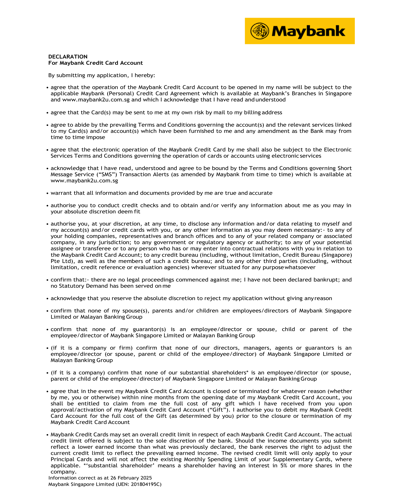

In [59]:
processed_images[0]["image"].resize((400,500))

Now that we've generated a list of images that we can use, let's move on to embedding them in our LanceDB database.

## Generating and Storing Document Embeddings

With our documents prepared, we now need to create rich vector representations that capture their visual and textual elements. 

This section demonstrates how to use Cohere's Embed V4 model to generate multimodal embeddings and store them efficiently in LanceDB for fast retrieval.

We'll accomplish this in three steps:

1. Define a data model for our document pages with proper metadata
2. Process document pages asynchronously through Cohere's API so that we can scale this to larger document batches
3. Ingesting the resulting embeddings in our vector database

Let's first start by defining our Schema using the `LanceModel` class that `LanceDB` provides. Since there isn't a in-built integration with the `Embed_V4` model just yet, we'll have to generate our embeddings ourselves.

In [62]:
from lancedb.pydantic import LanceModel, Vector
import lancedb


class PDFPage(LanceModel):
    page: int
    filename: str
    embedding: Vector(1536)


db = lancedb.connect("./lancedb")
table = db.create_table("pdf_pages", schema=PDFPage, mode="overwrite")

Now let's write a short function that we can use to embed our PDF page. Note here that we're using the `AsyncClient` so that we can run our API calls in parallel. 

This is especially useful when we have large batches of document images to be processed.

In [60]:
import cohere
from tqdm.asyncio import tqdm_asyncio

co = cohere.AsyncClientV2()


async def embed_page(page: dict) -> list[float]:
    api_input_document = {
        "content": [
            {"type": "image", "image": page["image_base64"]},
        ]
    }
    resp = await co.embed(
        model="embed-v4.0",
        input_type="search_document",
        embedding_types=["float"],
        inputs=[api_input_document],
    )
    return {
        "page": page["page"],
        "filename": page["filename"],
        "embedding": resp.embeddings.float[0],
    }


coros = [embed_page(page) for page in processed_images]
embeddings_with_metadata = await tqdm_asyncio.gather(*coros)

100%|██████████| 26/26 [00:16<00:00,  1.59it/s]


Now that we've embedded all of our data, let's save it into our LanceDB database.

In [63]:
table.add(embeddings_with_metadata)
print(f"Total rows in table: {table.count_rows()}")

Total rows in table: 26


We've now ingested all of our document pages into our LanceDB. Let's see how well our new embedding model performs.

## Building a Visual Document Search System

Now that we've ingested our documents into our LanceDB database, let's now see how well it performs against some sample user queries. Once we've retrieved these items, we'll visualise the top few pages.

In [64]:
# Some helper function to search across the embeddings
async def search(query, table: lancedb.table.Table, k: int = 5):
    # Compute the embedding for the query
    api_response = await co.embed(
        model="embed-v4.0",
        input_type="search_query",
        embedding_types=["float"],
        texts=[query],
    )

    query_emb = api_response.embeddings.float[0]

    return (
        table.search(
            query=query_emb, query_type="vector", vector_column_name="embedding"
        )
        .limit(k)
        .to_list()
    )


relevant_results = [
    {"page": item["page"], "filename": item["filename"]}
    for item in await search("What is the yearly fee of the Maybank card?", table)
]

In order to display the retrieved page, we'll also  define a simple function which generates a mapping of the image of the page given a filename and a page. This will allow us to quickly lookup and visualise the relevant pages.

In [65]:
def get_all_pdf_images(data_dir):
    file_to_page = {}

    for file in os.listdir(data_dir):
        if file.endswith(".pdf"):
            file_to_page[file] = {}
            images = convert_from_path(os.path.join(data_dir, file))
            for idx, image in enumerate(images):
                file_to_page[file][idx] = image
    return file_to_page

file_to_page = get_all_pdf_images(DATA_DIR)
pdf_images = [file_to_page[item["filename"]][item["page"]] for item in relevant_results]

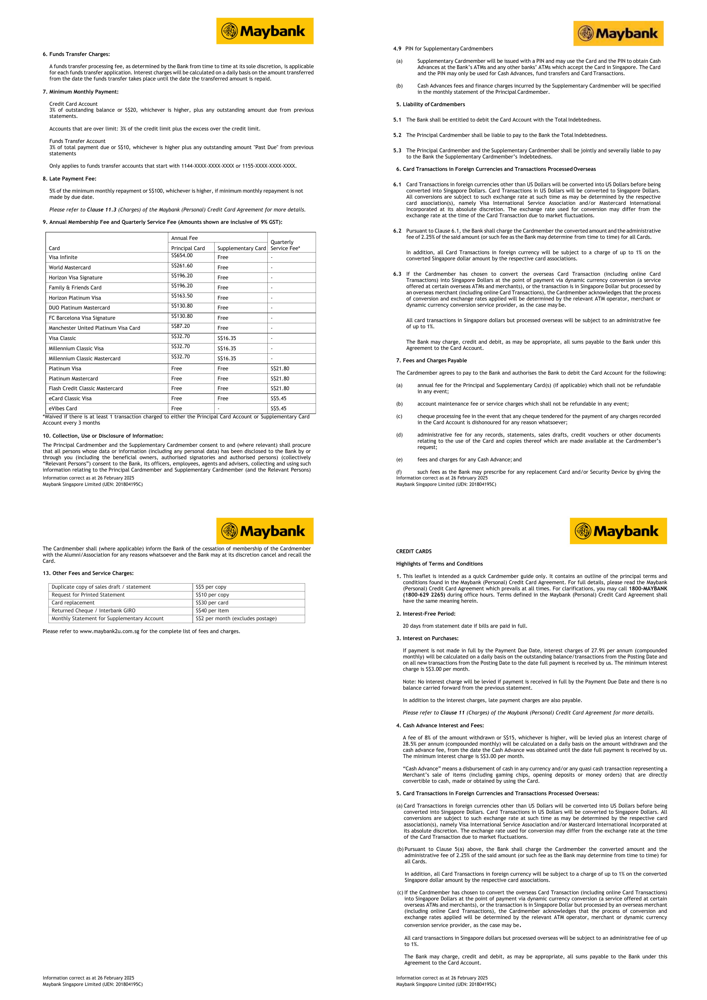

In [67]:
def combine_images_vertically(images):
    """
    Combines 4 images into a 2x2 grid layout, centered in each cell.
    
    Args:
        images: List of 4 PIL images to combine
    
    Returns:
        A single PIL image containing the 2x2 grid of images
    """
    from PIL import Image
    
    # Calculate grid dimensions (2x2)
    cols = 2
    rows = 2
    
    # Find the maximum width and height
    max_width = max(img.width for img in images)
    max_height = max(img.height for img in images)
    
    # Create a new blank image
    grid_width = max_width * cols
    grid_height = max_height * rows
    combined_img = Image.new('RGB', (grid_width, grid_height), color='white')
    
    # Paste each image into the grid
    for idx, img in enumerate(images):
        row = idx // cols
        col = idx % cols
        
        # Calculate position to center the image in its cell
        x_offset = col * max_width + (max_width - img.width) // 2
        y_offset = row * max_height + (max_height - img.height) // 2
        
        combined_img.paste(img, (x_offset, y_offset))
    
    return combined_img

# Display the combined image
combined_img = combine_images_vertically(pdf_images)
display(combined_img)



Let's now combine this into a single function so we can see how it performs for a few other queries.

In our first attempt, we can see that at the bottom of the first result, we see that it returns the page that indicates the minimum number of golfers is 3 for a single booking.

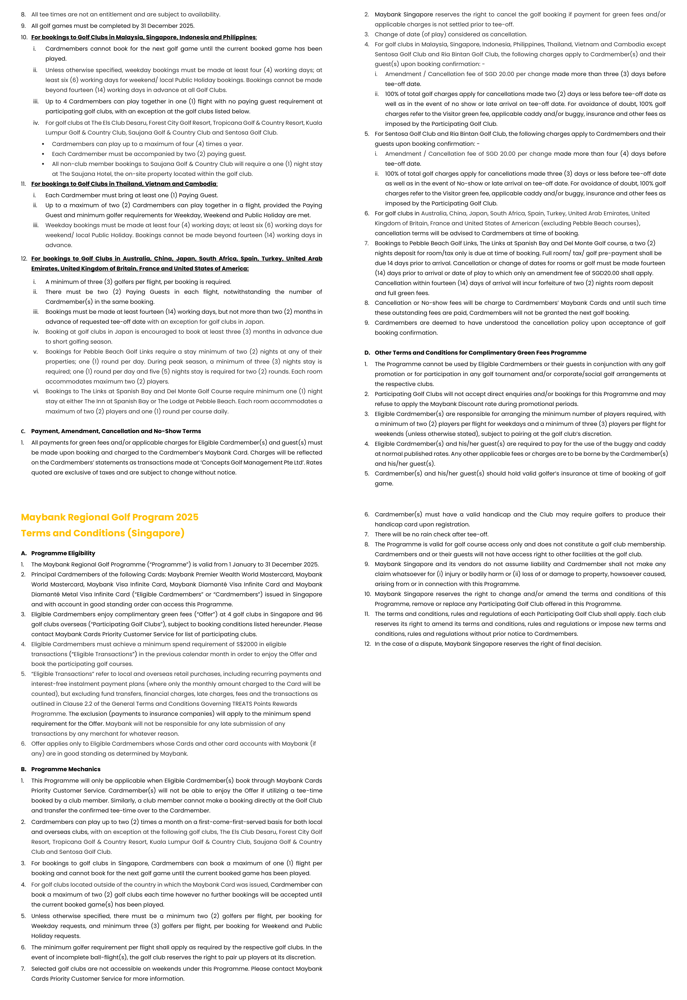

In [70]:
async def search_and_visualise(query, table: lancedb.table.Table, k: int = 5):    
    relevant_results = [
        {"page": item["page"], "filename": item["filename"]}
        for item in await search(query, table, k=k)
    ]
    
    # Get all images for the relevant results
    pdf_images = [
        file_to_page[item["filename"]][item["page"]]
        for item in relevant_results
    ]

    combined = combine_images_vertically(pdf_images)
    display(combined)

await search_and_visualise("What are the minimum number of golfers for a single booking?", table) 
    

Let's now try some generic task-oriented queries such as the fee if I want a physical statement. We can see that the embedding was able to exactly match the section where we had the fee to be paid marked as `Request for Printed Statement`

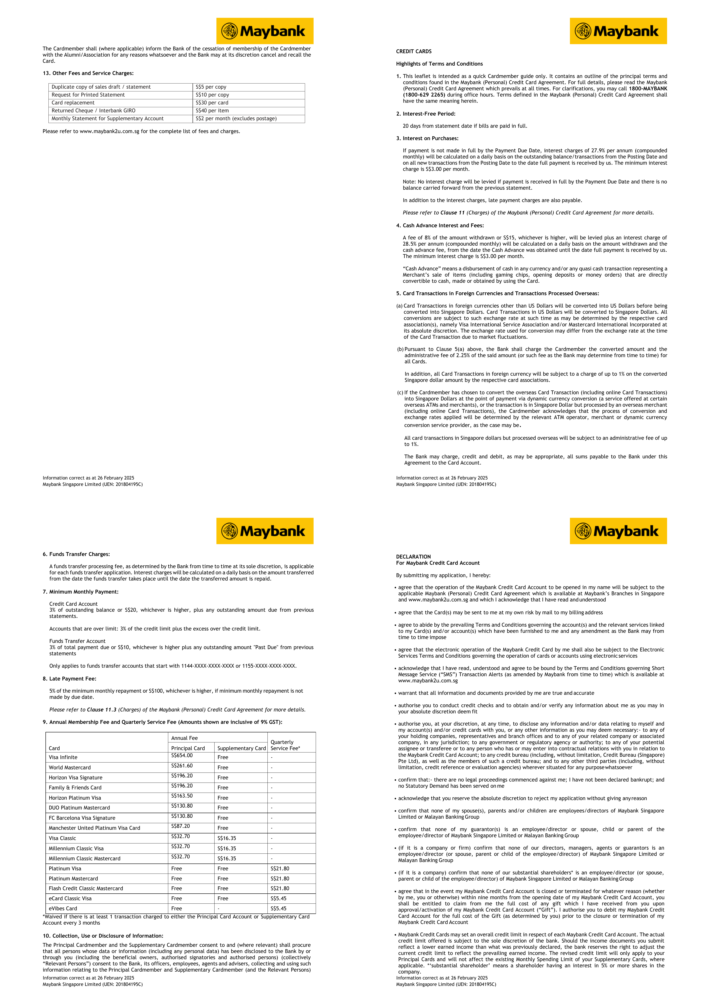

In [71]:
await search_and_visualise("how much do I pay if I want a physical statement?", table) # We expect the golf and travel perks

## Conclusion

In this notebook, we explored how multimodal embeddings can significantly improve RAG applications when working with complex documents. By converting PDFs to images and embedding them with Cohere's Embed V4 model, we've created a retrieval system that understands both content and visual layout.

This approach offers several key advantages over traditional text-only extraction:

- It preserves the visual context that carries meaning in structured documents
- It works with documents where OCR might struggle or miss important visual elements
- It enables more natural queries about information that depends on document layout

As organizations continue to digitize their document workflows, the ability to intelligently search and retrieve information from visual documents becomes increasingly valuable. This technique bridges the gap between unstructured text retrieval and structured data systems we explored earlier in Week 5.

Looking ahead to Week 6, these document processing capabilities become another specialized tool in our RAG toolkit.